In [87]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import pickle

import statsmodels.api as sm
from sklearn import cross_validation, feature_selection, grid_search, linear_model            

In [88]:
with open("consolDF.pkl", 'rb') as picklefile: 
    df = pickle.load(picklefile)

df.columns

Index(['movie_title', 'gtr_domestic', 'gtr_foreign', 'gtr_opening',
       'open_ranking', 'widest_release', 'prod_budget', 'big_budget',
       'days_in_release', 'year_of_release', 'year_week_index',
       'total_world_sales', 'week_movies_out', 'week_overall_gross',
       'three_week_total', 'new_releases_in_same_week', 'three_week_opening',
       'three_week_opening_gtr', 'target'],
      dtype='object')

In [89]:
target = df['target']

In [90]:
df.dtypes

movie_title                   object
gtr_domestic                   int64
gtr_foreign                    int64
gtr_opening                    int64
open_ranking                   int64
widest_release                 int64
prod_budget                  float64
big_budget                   float64
days_in_release              float64
year_of_release                int64
year_week_index               object
total_world_sales              int64
week_movies_out                int64
week_overall_gross             int64
three_week_total               int64
new_releases_in_same_week      int64
three_week_opening             int64
three_week_opening_gtr         int64
target                       float64
dtype: object

In [91]:
df.columns

Index(['movie_title', 'gtr_domestic', 'gtr_foreign', 'gtr_opening',
       'open_ranking', 'widest_release', 'prod_budget', 'big_budget',
       'days_in_release', 'year_of_release', 'year_week_index',
       'total_world_sales', 'week_movies_out', 'week_overall_gross',
       'three_week_total', 'new_releases_in_same_week', 'three_week_opening',
       'three_week_opening_gtr', 'target'],
      dtype='object')

In [92]:
df.drop(['movie_title','year_week_index'],axis=1,inplace=True)

In [93]:
df.columns

Index(['gtr_domestic', 'gtr_foreign', 'gtr_opening', 'open_ranking',
       'widest_release', 'prod_budget', 'big_budget', 'days_in_release',
       'year_of_release', 'total_world_sales', 'week_movies_out',
       'week_overall_gross', 'three_week_total', 'new_releases_in_same_week',
       'three_week_opening', 'three_week_opening_gtr', 'target'],
      dtype='object')

In [94]:
df.shape

(10233, 17)

In [95]:
def scatter_matrix(X):
    feature_count = len(X.columns)
    fig,ax = plt.subplots(ncols=feature_count,nrows=feature_count,figsize=(10*feature_count, 10*feature_count))

    for i,feature_i in enumerate(X):
        for j,feature_j in enumerate(X):
            ax[i][j].scatter(X[feature_i],X[feature_j])
            ax[i][j].set_xlabel('Feature ' + str(feature_j))
            ax[i][j].set_ylabel('Feature ' + str(feature_i))

In [50]:
# pd.scatter_matrix(df[['A_gtr_domestic','G_open_rankings_squared',
#                       'A_widest_release','B_days_in_release','G_domestic_%_total',
#                       'D_three_week_opening_releases','C_three_week_total','G_market_share_opening_gtr',
#                      ]].dropna(), alpha=0.2, figsize=(18, 18), diagonal='kde')

In [51]:
scatter_matrix(df)

In [96]:
df.drop(['gtr_domestic', 'gtr_foreign', 'gtr_opening', 'open_ranking','week_movies_out',
         'prod_budget', 'big_budget','year_of_release', 'total_world_sales',
         'week_overall_gross', 'three_week_total', 'three_week_opening_gtr','target'],axis=1,inplace=True)
df.columns

Index(['widest_release', 'days_in_release', 'new_releases_in_same_week',
       'three_week_opening'],
      dtype='object')

In [97]:
df

,widest_release,days_in_release,new_releases_in_same_week,three_week_opening
0,1,69.0,20,23
1,26,69.0,20,23
2,1,15.0,20,23
3,2459,48.0,20,23
4,27,69.0,20,23
5,2,90.0,20,23
6,4,34.0,20,23
7,2,13.0,20,23
8,0,69.0,20,23
9,44,48.0,20,23


In [98]:
df.max()

widest_release               5747.0
days_in_release              2855.0
new_releases_in_same_week      28.0
three_week_opening             31.0
dtype: float64

In [99]:
a = list(df.columns)
b = list(df.isnull().sum(axis=0).tolist())
list(zip(a,b))

[('widest_release', 0),
 ('days_in_release', 0),
 ('new_releases_in_same_week', 0),
 ('three_week_opening', 0)]

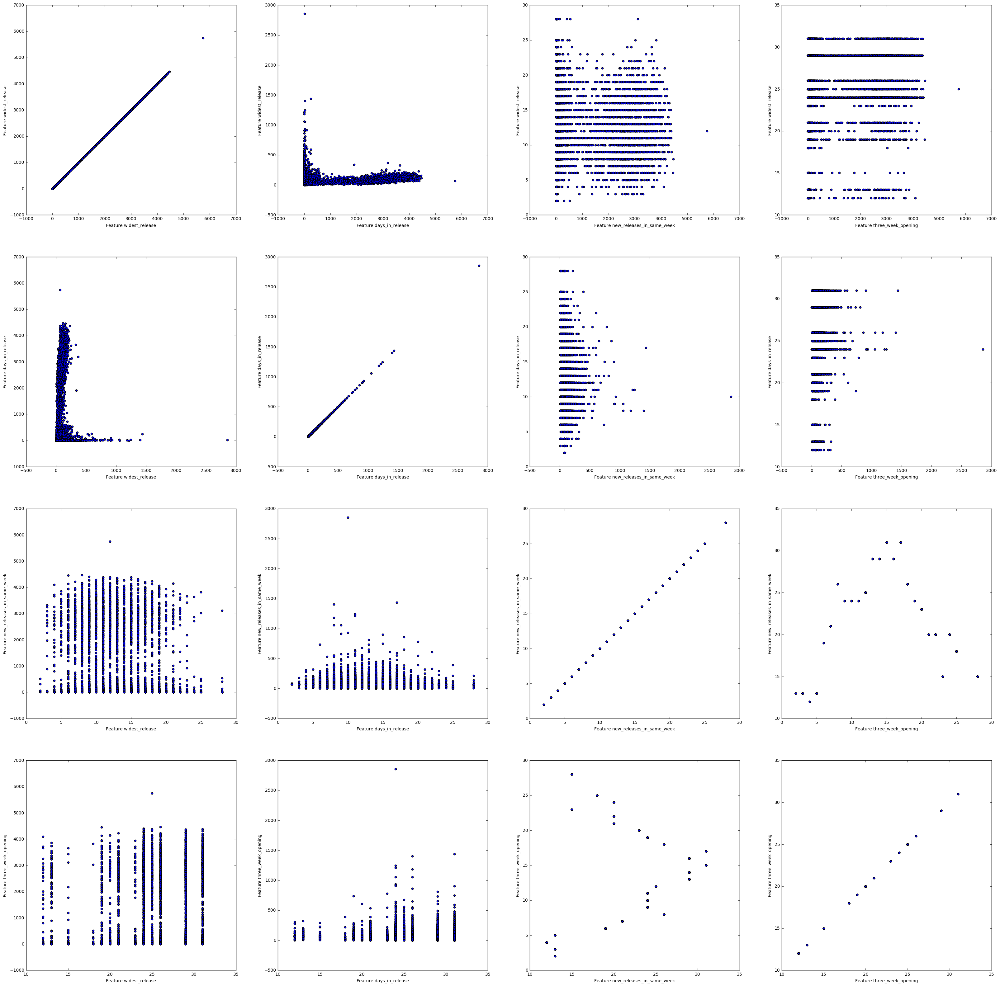

In [100]:
scatter_matrix(df)

In [84]:
X = df.loc[:,['widest_release','days_in_release','week_movies_out','new_releases_in_same_week','three_week_opening']]
y = target
X = sm.add_constant(X)
X.head()

model = sm.OLS(y, X)
results = model.fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 target   R-squared:                       0.404
Model:                            OLS   Adj. R-squared:                  0.404
Method:                 Least Squares   F-statistic:                     1386.
Date:                Thu, 06 Oct 2016   Prob (F-statistic):               0.00
Time:                        16:48:28   Log-Likelihood:            -2.0352e+05
No. Observations:               10233   AIC:                         4.071e+05
Df Residuals:                   10227   BIC:                         4.071e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [95.0% Conf. Int.]
---------------------------------------------------------------------------------------------
const                      8.859e+06   7.67e+06      1.156      0.248     -6.17e+06  2.39e+07
widest_release             7.108e+04    885.008     80.316      0.000      6.93e+04  7.28e+04
days_in_release             1.39e+05   1.32e+04     10.524      0.000      1.13e+05  1.65e+05
week_movies_out            7.483e+04   4.84e+04      1.546      0.122        -2e+04   1.7e+05
new_releases_in_same_week -9.875e+05   2.96e+05     -3.331      0.001     -1.57e+06 -4.06e+05
three_week_opening        -6.783e+05   2.93e+05     -2.317      0.021     -1.25e+06 -1.04e+05
==============================================================================
Omnibus:                    12747.536   Durbin-Watson:                   1.916
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          3649410.072
Skew:                           6.551   Prob(JB):                         0.00
Kurtosis:                      94.583   Cond. No.                     1.00e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large,  1e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [101]:
models = {}
models['lin_reg'] = linear_model.LinearRegression()
models['ridge'] = linear_model.Ridge()
models['lasso'] = linear_model.Lasso(alpha=0.8)
models['elasticnet'] = linear_model.ElasticNet()

In [102]:
X_train, X_test, y_train, y_test = cross_validation.train_test_split(df, target, test_size=0.3)

for name,model in models.items():
    model.fit(X_train,y_train)
    print('Model: '+ name)
    print("Score: " + str(model.score(X_test,y_test)))
    sorted_features = sorted(zip(df.columns, model.coef_), key=lambda tup: abs(tup[1]), reverse=True)
    for feature in sorted_features:
        print(feature)
        
    print("")

Model: lin_reg
Score: 0.417244656216
('new_releases_in_same_week', -1029936.7631361809)
('three_week_opening', -690964.97892337444)
('days_in_release', 148628.25419305445)
('widest_release', 71612.241013625346)

Model: lasso
Score: 0.417244656321
('new_releases_in_same_week', -1029936.7280546813)
('three_week_opening', -690964.93896098691)
('days_in_release', 148628.25424749378)
('widest_release', 71612.241034481878)

Model: elasticnet
Score: 0.41730077965
('new_releases_in_same_week', -1003893.7768312747)
('three_week_opening', -677940.0849593071)
('days_in_release', 148744.45623565899)
('widest_release', 71625.048150864706)

Model: ridge
Score: 0.417244672532
('new_releases_in_same_week', -1029929.2876529406)
('three_week_opening', -690961.29490395694)
('days_in_release', 148628.28761290081)
('widest_release', 71612.244680734264)



In [60]:
shuffler = cross_validation.ShuffleSplit(100)

for name,model in models.items():
    score = cross_validation.cross_val_score(model, df, target, n_jobs=1, cv=shuffler)
    print('Model: ' + name)
    print(score)
    print("Score: " + str(np.mean(score)) + " with STD: " + str(np.std(score)))
    sorted_features = sorted(zip(df.columns,model.coef_), key=lambda tup: abs(tup[1]), reverse=True)
    for feature in sorted_features:
        print(feature)
        
    print("")

Model: lin_reg
[  6.87815532e-01  -1.64679385e+01  -2.05578123e-01  -7.99897215e-01
  -8.49407564e+00  -1.45791613e+03   4.20487454e-01   8.67827841e-01
  -5.31187483e-01  -6.93866530e+03]
Score: -842.110397358 with STD: 2077.96636385
('new_releases_in_same_week', -890366.22729259636)
('three_week_opening', -775018.52672824205)
('days_in_release', 140118.68185664868)
('widest_release', 70941.036638621794)
('week_movies_out', 45247.846633226101)

Model: lasso
[ 0.45324337  0.4598685   0.21565833  0.64704114  0.3125223   0.44936906
  0.85888839  0.35304094 -0.52427369  0.92299857]
Score: 0.414835691111 with STD: 0.380777102054
('new_releases_in_same_week', -890366.17192423926)
('three_week_opening', -775018.47475179052)
('days_in_release', 140118.68199306275)
('widest_release', 70941.036659784993)
('week_movies_out', 45247.838411931109)

Model: elasticnet
[  4.40719377e-01  -1.53965227e+02   6.52259415e-01   4.52374606e-01
   4.45684915e-01  -6.12189853e-01   4.36321199e-02   6.45562995e

In [61]:
from sklearn import cross_validation

import matplotlib.pyplot as plt
%matplotlib inline

def plot_overfit(X,y,model_obj,param_ranges,param_static=None): 
    for parameter,parameter_range in param_ranges.items():
        avg_train_score, avg_test_score = [],[]
        std_train_score, std_test_score = [],[]
        
        for param_val in parameter_range:
            param = {parameter:param_val}
            if param_static:
                param.update(param_static)
                
            model = model_obj(**param)
            
            train_scores,test_scores = [],[]
            for i in range(5):
                X_train,X_test,y_train,y_test = cross_validation.train_test_split(X,y,test_size = .5)
                model.fit(X_train,y_train)
                
                train_scores.append(model.score(X_train,y_train))
                test_scores.append(model.score(X_test,y_test))
            
            avg_train_score.append(np.mean(train_scores))
            avg_test_score.append(np.mean(test_scores))
            
            std_train_score.append(np.std(train_scores))
            std_test_score.append(np.std(test_scores))
            
        fig,ax = plt.subplots()
        ax.errorbar(parameter_range,avg_train_score,yerr=std_train_score,label='training score')
        ax.errorbar(parameter_range,avg_test_score,yerr=std_test_score,label='testing score')
        
        ax.set_xlabel(parameter)
        ax.set_ylabel('score')
        ax.legend(loc=0)

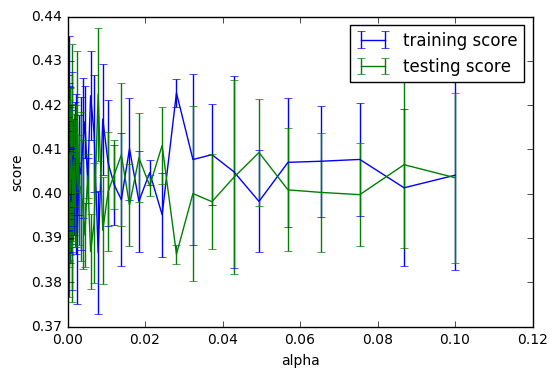

In [62]:
lasso = linear_model.Lasso
plot_overfit(df, target,lasso,{'alpha':np.logspace(-4,-1,50)})

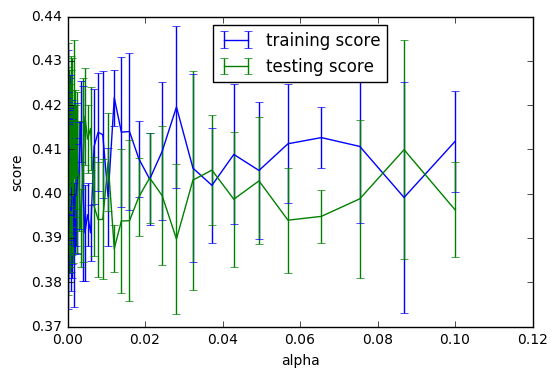

In [63]:
ridge = linear_model.Ridge
plot_overfit(df, target,ridge,{'alpha':np.logspace(-4,-1,50)})

/Users/THoshino/anaconda/envs/py35/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:466: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations
  ConvergenceWarning)


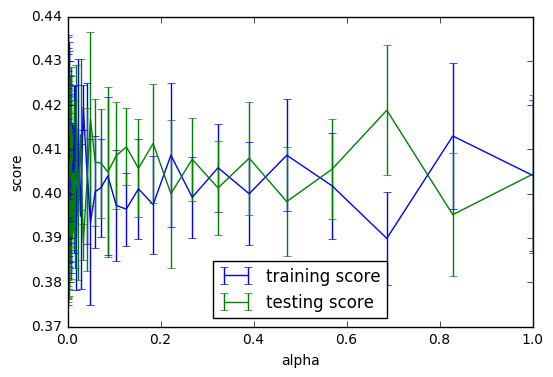

In [64]:
elastic = linear_model.ElasticNet
plot_overfit(df, target,elastic,{'alpha':np.logspace(-4,0,50)})

In [65]:
lasso = linear_model.Lasso()

parameters = {'normalize':(True,False),
              'alpha':np.logspace(-4,-.1,30)}
grid_searcher = grid_search.GridSearchCV(lasso, parameters)
grid_searcher.fit(df, target)

GridSearchCV(cv=None, error_score='raise',
       estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'normalize': (True, False), 'alpha': array([  1.00000e-04,   1.36296e-04,   1.85766e-04,   2.53191e-04,
         3.45089e-04,   4.70342e-04,   6.41057e-04,   8.73734e-04,
         1.19086e-03,   1.62310e-03,   2.21222e-03,   3.01516e-03,
         4.10954e-03,   5.60113e-03,   7.63411e-03...    1.68883e-01,   2.30181e-01,   3.13727e-01,   4.27597e-01,
         5.82797e-01,   7.94328e-01])},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=0)

In [66]:
grid_searcher.best_params_

{'alpha': 0.79432823472428149, 'normalize': True}

In [67]:
best_model = grid_searcher.best_estimator_
best_model.coef_

array([  71080.49866688,  139043.06256319,   74823.40346476,
       -987468.74424997, -678285.943835  ])

In [68]:
best_model.score(X_test,y_test)

0.44428092459313495